In [ ]:
  #import library

import pandas as pd #panda untuk dataset
import numpy as np #untuk perhitungan statistik
import matplotlib.pyplot as plt #untuk visualisasi
import seaborn as sns #untuk visualisasi juga

In [ ]:
for i in range(3):
       print('Hello!')
print('World!')

Hello!
Hello!
Hello!
World!


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/


In [ ]:
df_raw = pd.read_excel('/content/drive/My Drive/Colab Data/Credit_Scoring_Dataset.xlsx')

In [ ]:
#strutur data: Informasi detil mengenai data
#print(df_raw.INPUT)
print(df_raw.info())

#preview data
#print(df_raw.INPUT)
print(df_raw.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 12 columns):
X                            12500 non-null int64
SLIK_total_limit             12491 non-null float64
SLIK_pembayaran_per_limit    12499 non-null float64
SLIK_tagihan                 12495 non-null float64
pendapatan                   12498 non-null float64
target_default               12500 non-null int64
umur                         12492 non-null float64
gender                       12491 non-null object
status_rumah                 12499 non-null float64
jumlah_tanggungan            12500 non-null int64
kelas_pekerjaan              12500 non-null int64
status_tabungan              12478 non-null object
dtypes: float64(6), int64(4), object(2)
memory usage: 1.1+ MB
None
   X  SLIK_total_limit  ...  kelas_pekerjaan  status_tabungan
0  1         7000000.0  ...                1             high
1  2        10000000.0  ...                1             high
2  3        29000000.0  

In [ ]:
#2.1.5 Coding - Mengubah Tipe Data

#Mengubah variabel target_default dan kelas pekerjaan dari numerik ke string
#df_raw['INPUT'] = df_raw['INPUT'].astype(str)

df_raw["target_default"] = df_raw["target_default"].astype(str)
df_raw["kelas_pekerjaan"] = df_raw["kelas_pekerjaan"].astype(str)

In [ ]:
#cek data kosong
df_raw.info()
df_raw.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 12 columns):
X                            12500 non-null int64
SLIK_total_limit             12491 non-null float64
SLIK_pembayaran_per_limit    12499 non-null float64
SLIK_tagihan                 12495 non-null float64
pendapatan                   12498 non-null float64
target_default               12500 non-null object
umur                         12492 non-null float64
gender                       12491 non-null object
status_rumah                 12499 non-null float64
jumlah_tanggungan            12500 non-null int64
kelas_pekerjaan              12500 non-null object
status_tabungan              12478 non-null object
dtypes: float64(6), int64(2), object(4)
memory usage: 1.1+ MB


X                             0
SLIK_total_limit              9
SLIK_pembayaran_per_limit     1
SLIK_tagihan                  5
pendapatan                    2
target_default                0
umur                          8
gender                        9
status_rumah                  1
jumlah_tanggungan             0
kelas_pekerjaan               0
status_tabungan              22
dtype: int64

In [ ]:
#melihat statistika dari variabel numerik
df_raw.describe()

,X,SLIK_total_limit,SLIK_pembayaran_per_limit,SLIK_tagihan,pendapatan,umur,status_rumah,jumlah_tanggungan
count,12500.000000,1.249100e+04,1.249900e+04,1.249500e+04,1.249800e+04,12492.000000,12499.000000,12500.000000
mean,6250.500000,2.150268e+07,1.919605e+07,1.222110e+07,2.838598e+07,27.200208,0.715737,3.558720
std,3608.583517,3.056182e+07,3.958466e+08,2.593114e+07,4.595056e+07,10.112862,0.728070,1.705821
min,1.000000,3.000000e+06,-1.251600e+09,0.000000e+00,2.000000e+06,18.000000,0.000000,0.000000
25%,3125.750000,5.000000e+06,0.000000e+00,2.100000e+06,5.000000e+06,20.000000,0.000000,2.000000
50%,6250.500000,9.000000e+06,2.970000e+06,4.950000e+06,1.100000e+07,23.000000,1.000000,3.000000
75%,9375.250000,2.300000e+07,1.007000e+07,1.120000e+07,3.100000e+07,30.000000,1.000000,5.000000
max,12500.000000,1.050000e+09,3.387780e+10,8.452500e+08,1.559000e+09,60.000000,3.000000,8.000000


In [ ]:
#melihat statistika dari variabel teks/kategori
print(df_raw["status_tabungan"].value_counts())

little      8102
high        2723
moderate    1653
Name: status_tabungan, dtype: int64


In [ ]:
#melihat statistika dari variabel teks/kategori (presentase)

print(df_raw['status_tabungan'].value_counts(normalize = 'TRUE')) #normalize untuk mencari proporsi
#berapa persen yg gagal bayar?
print(df_raw['target_default'].value_counts(normalize = 'TRUE'))

little      0.649303
high        0.218224
moderate    0.132473
Name: status_tabungan, dtype: float64
0    0.90936
1    0.09064
Name: target_default, dtype: float64


Text(0.5, 1.0, 'Distribution Plot of Pendapatan')

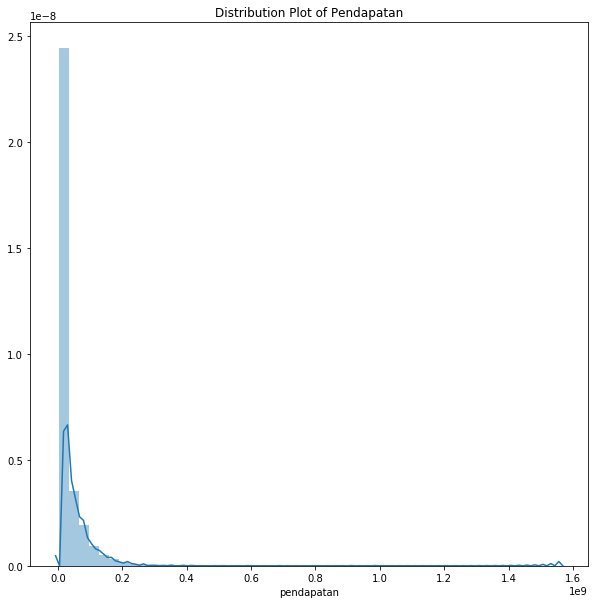

In [ ]:
#distribusi data numerik

fig, ax = plt.subplots(figsize = (10,10))
sns.distplot(df_raw['pendapatan'].dropna(),
             ax=ax).set_title('Distribution Plot of Pendapatan')

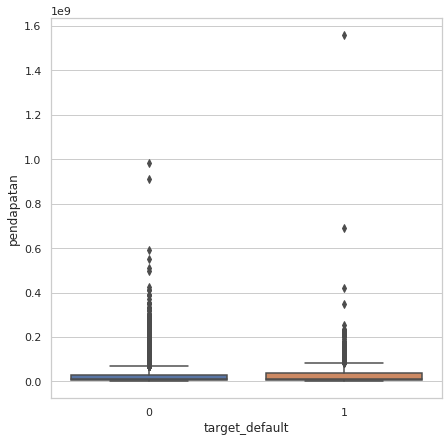

In [ ]:
fig, ax = plt.subplots(figsize=(7,7))
sns.set(style="whitegrid")
ax = sns.boxplot(y=df_raw["pendapatan"],x = df_raw['target_default'])

#Secara visualisasi, tidak tampak perbedaaan signifikan antara nilai rata-rata (mean) dari pendapatan nasabah yang gagal bayar dan berhasil bayar

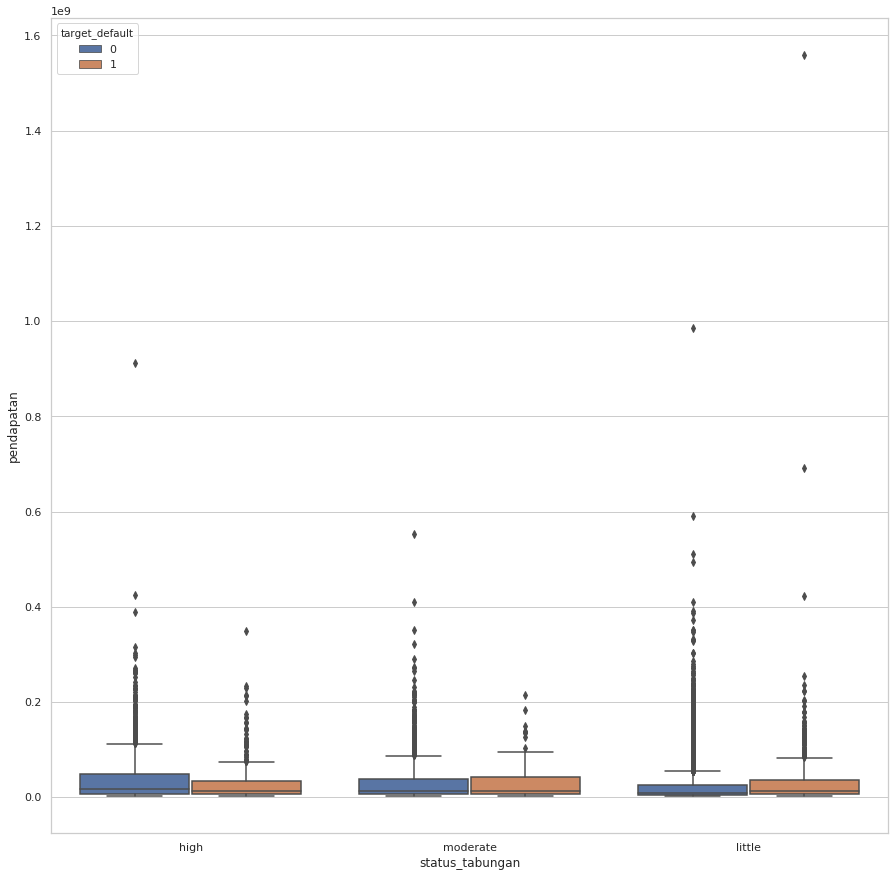

In [ ]:
#boxplot lanjutan
#cobalah kombinasi lainnya

fig, ax = plt.subplots(figsize=(15,15))
sns.set(style="whitegrid")
ax=sns.boxplot(y=df_raw["pendapatan"],
               x= df_raw['status_tabungan'],
               hue = df_raw['target_default'])

#hipotesis boxplot
'''Untuk nasabah dengan status_tabungan high, nasabah yang gagal bayar pada umumnya memiliki pendapatan yang lebih rendah daripada yang berhasil bayar.
Untuk nasabah dengan status_tabungan moderate, tidak terlihat perbedaan yang sangat signifikan antara gagal bayar dan berhasil bayar.
Untuk nasabah dengan status_tabungan little, nasabah yang gagal bayar memiliki pendapatan yang yang umumnya lebih tinggi daripada yang berhasil bayar.'''

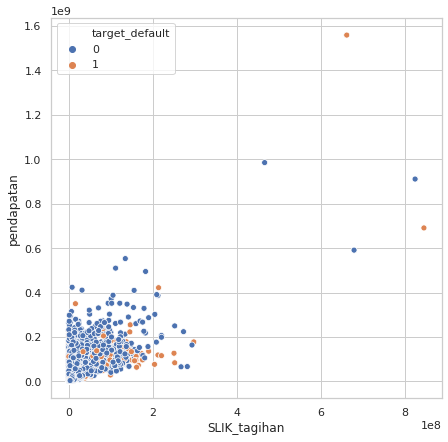

In [ ]:
#scatterplot
fig, ax = plt.subplots(figsize=(7,7))
ax = sns.scatterplot(x='SLIK_tagihan',
                     y='pendapatan',
                     hue='target_default', data=df_raw)

#hipotesis
'''Secara umum, semakin tinggi nilai dari SLIK-tagihan, semakin banyak nasabah yang gagal bayar
Secara umum, semakin rendah pendapatan, juga semakin banyak nasabah gagal bayar.'''

#gagal bayar = 1
#berhasil bayar = 0

In [ ]:
#distribusi data pervariabel
#melihat distribusi percentile dari variable numerik

df_raw.describe([.01,.05,.25,.75,.95,.99])
df_raw['pendapatan'].describe([.01,.05,.25,.75,.95,.99])

#read
'''Dari hasil desribe sebelumnya kita dapat menyimpulkan bahwa ada outlier di variabel pendapatan. Segelintir customer memiliki pendapatan yang sangat tinggi. 
Nilai minimum pendapatan adalah 2 juta, dan cukup banyak yang memiliki pendapatan minimum tersebut. 
Tetapi untuk pendapatan tertinggi adalah 1.5 milyar, dengan sekitar 1% persen nasabah memiliki pendapatan lebih dari 200 juta.'''

count    1.249800e+04
mean     2.838598e+07
std      4.595056e+07
min      2.000000e+06
1%       2.000000e+06
5%       2.000000e+06
25%      5.000000e+06
50%      1.100000e+07
75%      3.100000e+07
95%      1.120000e+08
99%      2.040300e+08
max      1.559000e+09
Name: pendapatan, dtype: float64

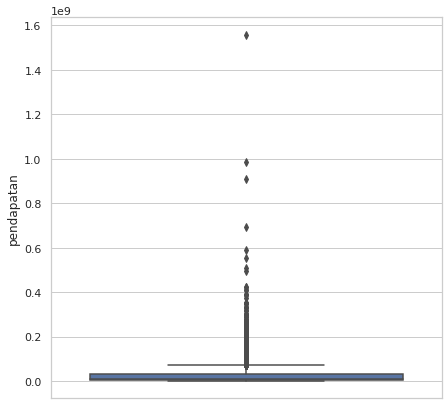

In [ ]:
#untuk counting
pd.crosstab(df_raw['status_tabungan'], df_raw['target_default'])

target_default,0,1
status_tabungan,,
high,2386,337
little,7399,703
moderate,1564,89


In [ ]:
#untuk persentase
pd.crosstab(df_raw['status_tabungan'], df_raw['target_default'], normalize='index')

target_default,0,1
status_tabungan,,
high,0.876239,0.123761
little,0.913231,0.086769
moderate,0.946158,0.053842


In [ ]:
df_raw[df_raw['target_default']=='0'].describe()

,X,SLIK_total_limit,SLIK_pembayaran_per_limit,SLIK_tagihan,pendapatan,umur,status_rumah,jumlah_tanggungan
count,11367.000000,1.135800e+04,1.136600e+04,1.136200e+04,1.136500e+04,11360.000000,11367.000000,11367.00000
mean,6248.937538,2.120373e+07,2.060485e+07,1.146583e+07,2.796058e+07,27.141813,0.712853,3.54755
std,3599.164353,2.877774e+07,4.149096e+08,2.286859e+07,4.346444e+07,10.070884,0.727453,1.70342
min,1.000000,3.000000e+06,-1.251600e+09,0.000000e+00,2.000000e+06,18.000000,0.000000,0.00000
25%,3124.500000,5.000000e+06,0.000000e+00,2.130000e+06,5.000000e+06,20.000000,0.000000,2.00000
50%,6269.000000,9.000000e+06,3.270000e+06,4.850000e+06,1.100000e+07,23.000000,1.000000,3.00000
75%,9362.500000,2.300000e+07,1.078000e+07,1.071000e+07,3.100000e+07,30.000000,1.000000,5.00000
max,12500.000000,5.250000e+08,3.387780e+10,8.242500e+08,9.850000e+08,60.000000,3.000000,8.00000


In [ ]:
df_raw[df_raw['target_default']=='1'].describe()

,X,SLIK_total_limit,SLIK_pembayaran_per_limit,SLIK_tagihan,pendapatan,umur,status_rumah,jumlah_tanggungan
count,1133.000000,1.133000e+03,1.133000e+03,1.133000e+03,1.133000e+03,1132.000000,1132.000000,1133.000000
mean,6266.175640,2.449956e+07,5.063230e+06,1.979519e+07,3.265313e+07,27.786219,0.744700,3.670786
std,3703.346646,4.457676e+07,3.800178e+07,4.593262e+07,6.576388e+07,10.511510,0.733931,1.726483
min,14.000000,3.000000e+06,-8.888000e+07,0.000000e+00,2.000000e+06,18.000000,0.000000,0.000000
25%,3148.000000,5.000000e+06,0.000000e+00,5.600000e+05,6.000000e+06,20.000000,0.000000,2.000000
50%,6115.000000,1.000000e+07,0.000000e+00,5.800000e+06,1.300000e+07,23.000000,1.000000,3.000000
75%,9572.000000,2.800000e+07,1.120000e+06,1.904000e+07,3.700000e+07,33.000000,1.000000,5.000000
max,12493.000000,1.050000e+09,1.155000e+09,8.452500e+08,1.559000e+09,60.000000,3.000000,8.000000


In [ ]:
#korelasi, >0.4 dikatakan cukup kuat
df_raw['target_default'].astype(int).corr(df_raw.fillna(0)['pendapatan'].astype(int))

0.02935216395119844

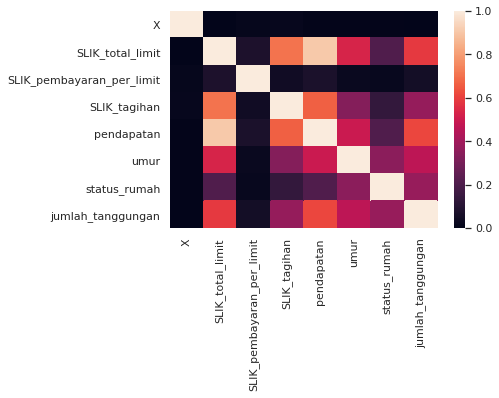

In [ ]:
#heatmap korelasi
corr=df_raw.corr()
sns.heatmap(corr,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

In [ ]:
#cara membaca heatmap korelasi
'''Sebagai contoh mari kita kita korelasi target_default dengan rasio utilisasi, kita dapat melihat kotaknya berwarna ungu muda, berarti korelasinya sekitar 0.4,
memang bukan korelasi yang kuat. Tapi rasio utilisasi adalah variabel dengan nilai korelasi tertinggi dengan variabel dependen target_default.

Mari kita lihat korelasi rasio utilisasi dengan sesama variabel independen, kita lihat rasio utilisasi memiliki korelasi sekitar 0.3, berarti korelasi lemah.
Tentunya kotak putih adalah korelasi variabel tersebut dengan dirinya sendiri, tentu nilainya adalah 1, sehingga warnanya putih.

Dari data yang ada, menunjukkan adalah kita dapat mempertimbangkan rasio utilisasi ke dalam model kita, karena variabel ini memiliki korelasi sekitar 0.4 dengan
variabel default_target, dan tidak memiliki multicollinearity dengan variabel lainnya
Mari kita lihat variabel SLIK_tagihan sebagai contoh variabel dengan multicollinearity: kita dapat melihat variabel ini memiliki korelasi lemah dengan 
target_default, tapi variabel ini memiliki korelasi kuat dengan variabel pendapatan dan SLIK_total_limit.'''

'Sebagai contoh mari kita kita korelasi target_default dengan rasio utilisasi, kita dapat melihat kotaknya berwarna ungu muda, berarti korelasinya sekitar 0.4,\nmemang bukan korelasi yang kuat. Tapi rasio utilisasi adalah variabel dengan nilai korelasi tertinggi dengan variabel dependen target_default.\n\nMari kita lihat korelasi rasio utilisasi dengan sesama variabel independen, kita lihat rasio utilisasi memiliki korelasi sekitar 0.3, berarti korelasi lemah.\nTentunya kotak putih adalah korelasi variabel tersebut dengan dirinya sendiri, tentu nilainya adalah 1, sehingga warnanya putih.\n\nDari data yang ada, menunjukkan adalah kita dapat mempertimbangkan rasio utilisasi ke dalam model kita, karena variabel ini memiliki korelasi sekitar 0.4 dengan\nvariabel default_target, dan tidak memiliki multicollinearity dengan variabel lainnya\nMari kita lihat variabel SLIK_tagihan sebagai contoh variabel dengan multicollinearity: kita dapat melihat variabel ini memiliki korelasi lemah dengan \n

In [ ]:
#2.8.1 Uji Hipotesis (membuktikan secara statistik)
'''
H0 (null hipotesis): rata-rata pendapatan dari kustomer yang gagal bayar adalah sama dengan rata-rata pendapatan dari kustomer yang tidak gagal bayar
H1 (alternative): rata-rata pendapatan dari kustomer yang gagal bayar adalah berbeda dengan rata-rata pendapatan dari kustomer yang tidak gagal bayar'''

'\nH0 (null hipotesis): rata-rata pendapatan dari kustomer yang gagal bayar adalah sama dengan rata-rata pendapatan dari kustomer yang tidak gagal bayar\nH1 (alternative): rata-rata pendapatan dari kustomer yang gagal bayar adalah berbeda dengan rata-rata pendapatan dari kustomer yang tidak gagal bayar'

In [ ]:
df_raw["target_default"] = df_raw["target_default"].astype(str)
df_raw["kelas_pekerjaan"] = df_raw["kelas_pekerjaan"].astype(str)

In [ ]:
#2.8.2 statistik Inferensial
from scipy import stats
td0 = df_raw[df_raw.target_default == '0']
td1 = df_raw[df_raw.target_default == '1']
stats.ttest_ind(td0.pendapatan,
                td1.pendapatan, nan_policy='omit')

Ttest_indResult(statistic=-3.279194214019225, pvalue=0.0010438865421792786)

In [ ]:
#SUMMARY Exploratory data analysis
'''
berikut adalah hasil analisa dan kesimpulan dari variabel pendapatan:

Hubungan dengan target_default: rata-rata pendapatan yang gagal bayar lebih tinggi daripada yang tidak gagal bayar

Nilai hilang/missing values: hanya sedikit data yang missing value, hanya kurang dari 1% dari total data. Rekomendasi data persiapan, adalah exclude data yang 
kosong/missing

Bentuk Distribusi: Distribusi tidak normal

Outlier: dari quiz yang telah kita lakukan, metode boxplot menunjukkan nilai range normal adalah antara 0 - 71 juta. Jadi nilai diatas 71 juta di anggap outlier.
Jadi ada outlier untuk variabel pendapatan. Langkah untuk menangani outlier sangat tergantung pada banyak faktor lainnya. Tapi secara umum, saya menyarakankan
untuk membuat semua nilai di atas 71 juta menjadi 71 juta saja. Pembatasan outlier tentunya akan juga berimbas kepada bentuk distribusi variabel tersebut

Multicollinearity: Variabel pendapatan memiliki korelasi tinggi dengan SLIK_total_limit dan SLIK_tagihan. Jadi ada multicollinearity.

Statistik inferensial: ada perbedaan rata-rata pendapatan antara yang gagal bayar dan yang tidak gagal bayar

Rekomendasinya adalah variabel dapat digunakan setelah data preparasi (karena ada missing values dan outlier). Tapi karena ada multicollinearity, 
dalam model harus memilih untuk menggunakan variabel pendapatan, atau menggunakan SLIK_total_limit atau SLIK_tagihan.'''

'\nberikut adalah hasil analisa dan kesimpulan dari variabel pendapatan:\n\nHubungan dengan target_default: rata-rata pendapatan yang gagal bayar lebih tinggi daripada yang tidak gagal bayar\n\nNilai hilang/missing values: hanya sedikit data yang missing value, hanya kurang dari 1% dari total data. Rekomendasi data persiapan, adalah exclude data yang \nkosong/missing\n\nBentuk Distribusi: Distribusi tidak normal\n\nOutlier: dari quiz yang telah kita lakukan, metode boxplot menunjukkan nilai range normal adalah antara 0 - 71 juta. Jadi nilai diatas 71 juta di anggap outlier.\nJadi ada outlier untuk variabel pendapatan. Langkah untuk menangani outlier sangat tergantung pada banyak faktor lainnya. Tapi secara umum, saya menyarakankan\nuntuk membuat semua nilai di atas 71 juta menjadi 71 juta saja. Pembatasan outlier tentunya akan juga berimbas kepada bentuk distribusi variabel tersebut\n\nMulticollinearity: Variabel pendapatan memiliki korelasi tinggi dengan SLIK_total_limit dan SLIK_tagi

In [ ]:
#3.1.1 DATA PREPARATION
'''
1. Menentukan action untuk data yang hilang (missing values)
2. Feature Engineering, pada bagian ini murid akan menggunakan pemahaman dalam masalah yang dihadapi untuk membentuk suatu variable baru, atau feature baru yang diharapkan dapat meningkatkan performa model
3. One Hot Encoding, pada bagian ini murid akan mentransformasi categorical karakter menjadi angka binari (1/0) sehingga bisa diinput ke dalam model machine learning
4. Oversampling/Undersampling, pada bagian ini murid akan diajarkan cara untuk mengatasi permasalahan imbalance pada data dengan cara meningkatkan jumlah target atau menurunkan jumlah non target
5. Scaling dataset, pada bagian ini murid akan melakukan scaling pada dataset agar model dapat memprediksi dengan baik.
6. Split training and test data set, pada bagian ini murid akan memisahkan dataset menjadi 3 bagian, yaitu training, testing, dan validation set'''

'\n1. Menentukan action untuk data yang hilang (missing values)\n2. Feature Engineering, pada bagian ini murid akan menggunakan pemahaman dalam masalah yang dihadapi untuk membentuk suatu variable baru, atau feature baru yang diharapkan dapat meningkatkan performa model\n3. One Hot Encoding, pada bagian ini murid akan mentransformasi categorical karakter menjadi angka binari (1/0) sehingga bisa diinput ke dalam model machine learning\n4. Oversampling/Undersampling, pada bagian ini murid akan diajarkan cara untuk mengatasi permasalahan imbalance pada data dengan cara meningkatkan jumlah target atau menurunkan jumlah non target\n5. Scaling dataset, pada bagian ini murid akan melakukan scaling pada dataset agar model dapat memprediksi dengan baik.\n6. Split training and test data set, pada bagian ini murid akan memisahkan dataset menjadi 3 bagian, yaitu training, testing, dan validation set'

In [ ]:
#3.1.2 import libraries

import pandas as pd #untuk dataset
import numpy as np #untuk perhitungan statistik

from sklearn.preprocessing import LabelEncoder 
from imblearn.over_sampling import SMOTE #untuk melakukan kalibrasi data yang tidak seimbang
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

#set dataframe dari df_raw menjadi df_prepare
df_prepare = df_raw


/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
#menangani data kosong: mengganti data NA dengan modus (Mengapa nilai modus? Karena nilai modus dapat digunakan untuk variabel data kategori dan juga numerik.)

for column in df_prepare.columns:
  df_prepare[column].fillna(df_prepare[column].mode()[0], inplace=True)


In [ ]:
#3.2 Feature Engineering (membuat kolom baru)

df_prepare['rasio_utilitas']=df_prepare['SLIK_tagihan']/df_prepare['SLIK_total_limit']
df_prepare['rasio_pembayaran']=df_prepare['SLIK_pembayaran_per_limit']/df_prepare['SLIK_tagihan']
#3.2.3 mengatasi Missing value

#cek apakah ada nilai N/A atau missing value
df_prepare.isnull().values.any()

#akan ada infinite value karena terjadi pembagian dengan 0, nilai infinite kita ganti dengan 0
df_prepare['rasio_pembayaran'] = df_prepare['rasio_pembayaran'].replace(np.inf, 0)

#ubah niali NaN menjadi 0
df_prepare['rasio_pembayaran'].fillna(0, inplace=True)

#cek apakah masih ada N/A atau missing value
df_prepare.isnull().values.any()

False

In [ ]:
df_prepare.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 14 columns):
X                            12500 non-null int64
SLIK_total_limit             12500 non-null float64
SLIK_pembayaran_per_limit    12500 non-null float64
SLIK_tagihan                 12500 non-null float64
pendapatan                   12500 non-null float64
target_default               12500 non-null object
umur                         12500 non-null float64
gender                       12500 non-null object
status_rumah                 12500 non-null float64
jumlah_tanggungan            12500 non-null int64
kelas_pekerjaan              12500 non-null object
status_tabungan              12500 non-null object
rasio_utilitas               12500 non-null float64
rasio_pembayaran             12500 non-null float64
dtypes: float64(8), int64(2), object(4)
memory usage: 1.3+ MB


In [ ]:
#3.3 One-Hot Encoding (mengkonversi data kategorik)

#langkah pertama adalah memisahkan variabel kategori dengan variabel numerik
dataset_dummies = df_prepare.select_dtypes(exclude = ['float64','int64','int'])
dataset_int = df_prepare.select_dtypes(include = ['float64','int64','int'])

#memisahkan target/dependent variabel dari dataset dengan variabel kategori
target = df_prepare['target_default']
dataset_dummies.drop(['target_default'], axis = 1, inplace =True)

#menggunakan function get_dummies dari panda untuk melakukan one hot encoding
dataset_dummies_df = pd.get_dummies(dataset_dummies, drop_first = True)

#menggabungkan dataset variabel kategori dari one hot encoding dengan variabel numerik
dataset= pd.concat([dataset_dummies_df, dataset_int], axis =1)
feature_name = dataset.columns
df_encoded = pd.concat([dataset, target], axis = 1)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
#persiapan sebelum melakukan data preparation lainnya.

#pada bagian ini kita mempersiapkan dataset kita dengan memastikan tidak ada
#nilai yang missing ataupun nilai yang aneh (seperti infinity dan missing value)
df_encoded[df_encoded==np.inf]=np.nan
df_encoded.fillna(df_encoded.mean(), inplace=True)

#jangan lupa juga untuk exclude variabel X yang sebenarnya hanyalah index nasabah saja
df_encoded.drop(['X'], axis = 1, inplace =True)

In [ ]:
df_encoded

,gender_M,kelas_pekerjaan_2,kelas_pekerjaan_3,kelas_pekerjaan_4,status_tabungan_little,status_tabungan_moderate,SLIK_total_limit,SLIK_pembayaran_per_limit,SLIK_tagihan,pendapatan,umur,status_rumah,jumlah_tanggungan,rasio_utilitas,rasio_pembayaran,target_default
0,0,0,0,0,0,0,7000000.0,7490000.0,70000.0,6000000.0,25.0,0.0,2,0.01,107.000000,0
1,0,0,0,0,0,0,10000000.0,0.0,300000.0,10000000.0,23.0,0.0,2,0.03,0.000000,0
2,1,1,0,0,0,1,29000000.0,29580000.0,6960000.0,22000000.0,25.0,0.0,2,0.24,4.250000,0
3,0,0,1,0,1,0,22000000.0,21780000.0,3740000.0,54000000.0,37.0,2.0,7,0.17,5.823529,0
4,0,0,1,0,1,0,10000000.0,11000000.0,9200000.0,20000000.0,41.0,0.0,3,0.92,1.195652,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12495,0,0,0,0,1,0,7000000.0,0.0,7700000.0,12000000.0,22.0,1.0,4,1.10,0.000000,0
12496,0,0,0,0,1,0,5000000.0,5150000.0,2300000.0,4000000.0,23.0,0.0,3,0.46,2.239130,0
12497,1,0,0,0,1,0,4000000.0,4520000.0,4960000.0,4000000.0,25.0,2.0,5,1.24,0.911290,0
12498,0,0,0,0,1,0,3000000.0,4080000.0,3000000.0,4000000.0,18.0,0.0,1,1.00,1.360000,0


In [ ]:
#3.4.2 Imbalance Data Coding

#X sebagai semua variabel independent, input untuk model
X= df_encoded.iloc[:,0:len(df_encoded.columns)-1]

#y sebagai target atau variabel dependent
y=df_encoded.iloc[:,len(df_encoded.columns)-1]

#menggunakan function SMOTE untuk melakukan kombinasi oversampling/undersampling

#function SMOTE dengan menerapkan rasio 20% atau 0.2
sm = SMOTE(random_state = 42, ratio = 0.2)

#Hasil dari function SMOTE disimpan dalam variabel x dan y
x_imbal, y_imbal = sm.fit_sample(X, y.ravel())

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
#3.5.2 Scaling Data Set Coding

#memanggil fungsi standard scaler
sc = StandardScaler()

#merubah nilai X menjadi standardisation
x_scale = sc.fit_transform(x_imbal)

In [ ]:
#3.5.3 Split Training dan TEsting coding

#membagi data set menjadi train dan test, dimana proporsi test adalah 0.3/30% dari total datset
X_train, X_test, y_train, y_test = train_test_split(x_scale, y_imbal, test_size = 0.3)

#membagi lagi test data set menjadi dua, dimana 15% adalah test dan 15% digunakan sebagai validasi
X_test, X_test_holdup, y_test, y_testholdup = train_test_split(X_test, y_test, test_size = 0.5)

#karena X_train dalam bentuk array, tidak akan tersimpan nama variabel independen.
#oleh karena itu kita akan simpan dalam bentuk list nama-nama kolom
kolom=["gender_M","kelas_pekerja_2","kelas_pekerja_3","kelas_pekerja_4",
       "status_tabungan_little","status_tabungan_moderate","SLIK_total_limit",
       "SLIK_pembayaran_per_limit","SLIK_tagihan","pendapatan","umur","status_rumah",
       "jumlah_tanggungan","rasio_utilitas","rasio_pembayaran"]

#4. MODELLING OVERVIEW

In [ ]:
#4.2.2 Logistic Regression Coding
from sklearn.linear_model import LogisticRegression

#pembuatan model logistic regression
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

#Hasil dari model: parameter koefisien
parameters = log_reg.coef_
print(kolom)
print(parameters)

['gender_M', 'kelas_pekerja_2', 'kelas_pekerja_3', 'kelas_pekerja_4', 'status_tabungan_little', 'status_tabungan_moderate', 'SLIK_total_limit', 'SLIK_pembayaran_per_limit', 'SLIK_tagihan', 'pendapatan', 'umur', 'status_rumah', 'jumlah_tanggungan', 'rasio_utilitas', 'rasio_pembayaran']
[[-3.39530600e-02  3.04732082e-04 -3.19571429e-02 -1.80029181e-02
  -6.37875846e-01 -4.59360903e-01  1.34861734e-01 -5.83313464e+00
   2.57649977e-01 -1.18573227e-01  1.29739080e-02  8.42079580e-02
   1.83517451e-02  4.49554170e-01  1.42955441e-01]]


In [ ]:
parameters

array([[-0.03641428,  0.00998251, -0.02052035, -0.03709951, -0.61945097,
        -0.41809805,  0.08746226, -6.90265537,  0.28639981, -0.14518815,
         0.01262448,  0.08557152,  0.0503388 ,  0.40899149,  0.14744989]])

In [ ]:
#4.2.3 Parameter tuning coding

from sklearn.feature_selection import RFE

#membuat model RFE dan memilih variabel independen terbaik
rfe =RFE(log_reg)
rfe= rfe.fit(X_train, y_train)

#hasil variabel indipenden yang digunakan
rfe_result = rfe.support_.tolist()
kolom_result = [x for x, y in zip(kolom,rfe_result) if y == True]
print(kolom_result)

['status_tabungan_little', 'status_tabungan_moderate', 'SLIK_total_limit', 'SLIK_pembayaran_per_limit', 'SLIK_tagihan', 'rasio_utilitas', 'rasio_pembayaran']


In [ ]:
#4.3.2 Decision Tree Credit_Scoring_Dataset.xlsx

from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(criterion = 'entropy', random_state = 0, max_depth = 10,
                                    min_samples_split = 0.1, min_samples_leaf = 0.1)
classifier.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=0.1, min_samples_split=0.1,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=0, splitter='best')

In [ ]:
#4.3.3 Decision Tree: Parameter Tuning

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=10,
                       max_features = None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=0.1, min_samples_split=0.1,
                       min_weight_fraction_leaf=0.0, presort=False, random_state=0,
                       splitter='best')

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=0.1, min_samples_split=0.1,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')

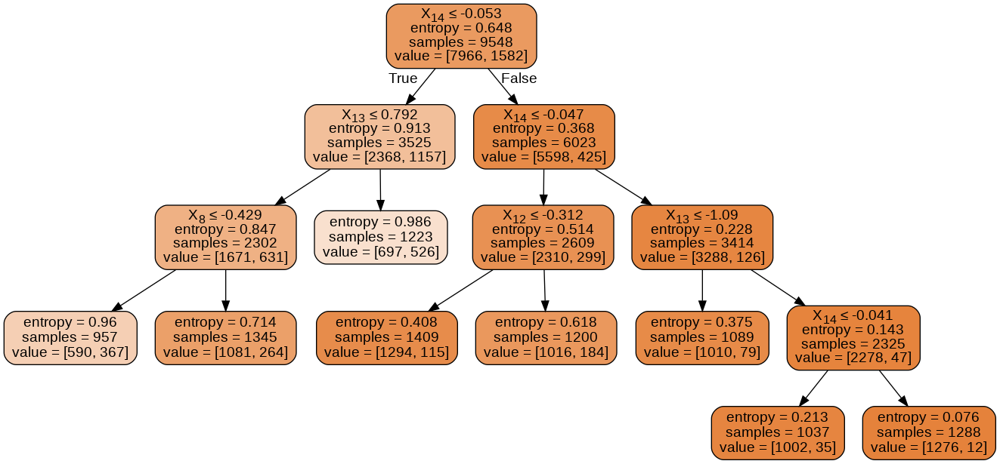

In [ ]:
#4.3.4 Decision Tree: Visualisasi

import pydotplus
import graphviz

from sklearn.tree import export_graphviz
from sklearn import tree
from IPython.display import SVG
from graphviz import Source
from IPython.display import display, Image
from sklearn.externals.six import StringIO

dot_data = StringIO()
export_graphviz(classifier, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

'''Decision tree menemukan bahwa variabel X14 (rasio_pembayaran), dimana semakin besar nilainya, semakin kecil kemungkinan gagal bayar.
Lalu di cabang Decision Tree berikutnya, variabel X13 (rasio_utilitas) menunjukan bahwa semakin kecil nilai rasio_utilitas, semakin kecil juga 
kemungkinan nasabah gagal bayar.'''

In [ ]:
#4.4 Random Forest
'''Kelebihan:
1. Non-parametrik.
2. Dapat memberikan hasil yang lebih akurat daripada decision tree.

Kekurangan:
1. Sulit untuk dimengerti, karena keputusan berdasarkan konsensus dari berbagai macam pohon.
2. Mudah dibuat, tapi sulit di implementasi.'''

In [ ]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators=10,
                                    criterion ='entropy', random_state = 0)
classifier.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [ ]:
classifier = RandomForestClassifier(n_estimators = 1000,
                                    criterion = 'entropy', random_state = 0,
                                    max_features = 'auto', max_depth = 10)
classifier.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

Text(0.5, 0, 'Relative Importance')

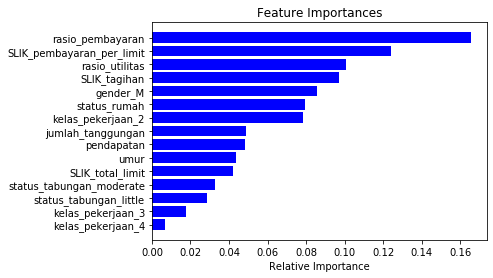

In [ ]:
importances = classifier.feature_importances_
indices = np.argsort(importances)
features = df_encoded.columns
plt.figure(1)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

In [ ]:
#interpretasi hasil randomforest
'''Random Forest Variable Importance menunjukan variabel dengan dampak terbesar yang menentukan nasabah gagal bayar atau tidak. Akan tetapi, variable importance tidak memberi petunjuk apakah nilai yang tinggi atau rendah yang menyebabkan nasabah gagal bayar.

Dalam contoh credit scoring, variable importance tertinggi adalah rasio pembayaran. Tetapi kita tidak tahu apakah nilai rasio pembayaran yang tinggi atau rendah menyebabkan nasabah gagal bayar.'''

'Random Forest Variable Importance menunjukan variabel dengan dampak terbesar yang menentukan nasabah gagal bayar atau tidak. Akan tetapi, variable importance tidak memberi petunjuk apakah nilai yang tinggi atau rendah yang menyebabkan nasabah gagal bayar.\n\nDalam contoh credit scoring, variable importance tertinggi adalah rasio pembayaran. Tetapi kita tidak tahu apakah nilai rasio pembayaran yang tinggi atau rendah menyebabkan nasabah gagal bayar.'

In [ ]:
!pip install shap

     |████████████████████████████████| 266kB 2.5MB/s 
  Created wheel for shap: filename=shap-0.34.0-cp36-cp36m-linux_x86_64.whl size=383175 sha256=538d67bda042af85c6609b90956b90f3a50a70d8e4bc75d14929d7820a5e41a1
  Stored in directory: /root/.cache/pip/wheels/28/7e/28/57bc9fcb77579b0df6561298648249370648c0b91dfe42c8ec
Successfully built shap


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


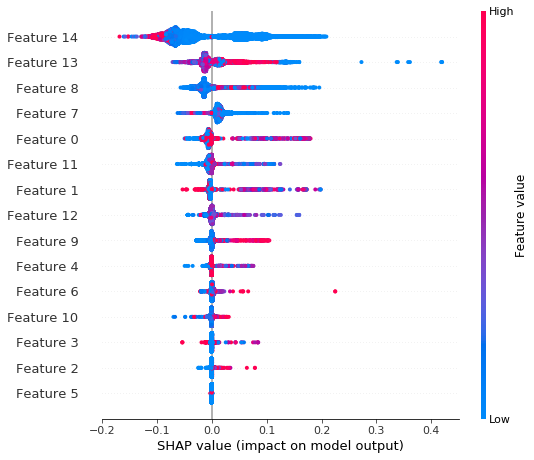

In [ ]:
#4.5 Xtreme Gradient Boosting
'''
Kelebihan xGB:

xGB dapat memberikan performa modeling yang lebih baik dari Random Forest, sepanjang kita dapat melakukan parameter tuning yang tepat.
xGB sering digunakan untuk menganalisa risk scoring
Kekurangan xGB:

sulit untuk melakukan parameter tuning yang tepat untuk xGB'''

import xgboost
classifier = xgboost.train({"learning_rate":0.01},
                           xgboost.DMatrix(X_train, label=y_train), 100)
import shap
import numpy.core.multiarray

shap.initjs()

explainer = shap.TreeExplainer(classifier)
shap_values = explainer.shap_values(X_train)

#rangkuman hasil analisa dari semua variabel
shap.summary_plot(shap_values, X_train)


In [ ]:
#xGB coding (modeling)

explainer = shap.TreeExplainer(classifier)
shap_values = explainer.shap_values(X_train)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


In [ ]:
# xGB coding 2

shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

AttributeError: ignored

In [ ]:
#visualize thr training set predictions
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X_train)

shap.force_plot is slow for many thousands of rows, try subsampling your data.


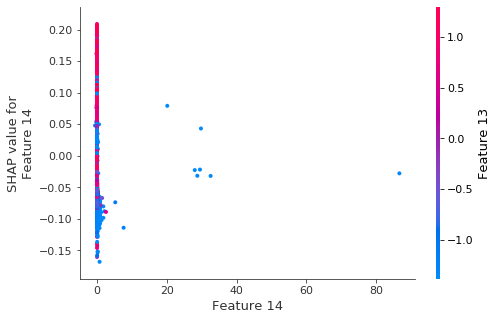

In [ ]:
#4.5.6 xGB Coding (Hasil dari Satu Variabel)

#create a SHAP dependence plot
#to show the effect of single feature across the whole dataset
shap.dependence_plot("Feature 14", shap_values, X_train)

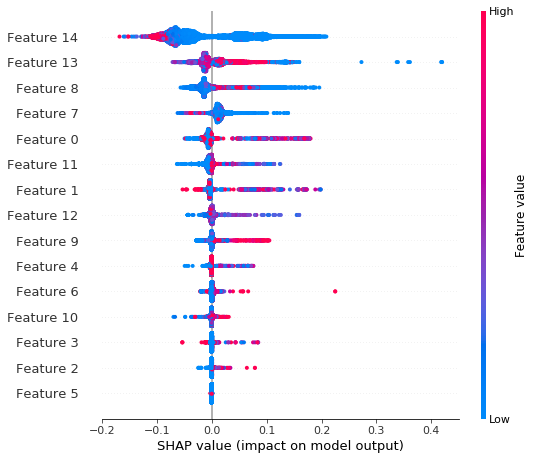

In [ ]:
#4.5.7 xGB Coding (Interpretasi Hasil)

#summarize the effect of all features
shap.summary_plot(shap_values, X_train)

#Scorecard with Logistic Regression (model standard di Fintech dan bank)

Kelebihan dari penggunaan WoE, IV, dalam Credit Scoring dengan Logistic Regression:
1. Fleksibel
Dapat menangani missing value dan nilai outlier dengan baik
2. Mengikuti syarat statistik
Karena logistic regression adalah distribusi logaritmik. WoE dan IV membuat transformasi nilai variabel mengikuti logaritmik juga.
3. Mudah penggunaannya
Karena tidak perlu membuat dummy variables
4. Dapat menunjukan hubungan trend yang jelas antara variabel dengan nasabah yang buruk

Hasil dari Information Value akan menunjukan kemampuan prediksi dari variabel tersebut, secara umum interpretasi dari IV adalah:

1. < 0.02: tidak berguna untuk prediksi
2. 0.02 to 0.1: memiliki kemampuan prediksi yang lemah
3. 0.1 to 0.3: prediksi yang cukup bagus
4. 0.3 to 0.5: prediksi yang kuat
5. ">0.5" : prediksi sangat kuat (bahkan terlalu bagus, cek sekali lagi jika ada kesalahan dalam pengumpulan data)

In [ ]:
pip install scorecardpy

In [ ]:
#scorecard import and preparation

#traditional credit scoring using Logistic Regression
import scorecardpy as sc

#data prepare
#scorecardpy library memiliki fungsi untuk data split, scale, dll.
#oleh krn itu kita akan load df_prepare saja
dat = df_prepare

#filter variabel secara otomatis
#filter otomatis variabel dari fungsi scorecard
#dengan tidak mengikutsertakan variabel yang terlalu banyak missing value dan nilai minimum information value
dt_s = sc.var_filter(dat, y = "target_default")

[INFO] filtering variables ...


/usr/local/lib/python3.6/dist-packages/scorecardpy/condition_fun.py:113: UserWarning: The positive value in "target_default" was replaced by 1 and negative value by 0.
  warnings.warn("The positive value in \"{}\" was replaced by 1 and negative value by 0.".format(y))


Variable filtering on 12500 rows and 14 columns in 00:00:23 
5 variables are removed


[INFO] creating woe binning ...
{'SLIK_total_limit':            variable                      bin  ...      breaks  is_special_values
0  SLIK_total_limit         [-inf,6000000.0)  ...   6000000.0              False
1  SLIK_total_limit   [6000000.0,10000000.0)  ...  10000000.0              False
2  SLIK_total_limit  [10000000.0,14000000.0)  ...  14000000.0              False
3  SLIK_total_limit  [14000000.0,20000000.0)  ...  20000000.0              False
4  SLIK_total_limit         [20000000.0,inf)  ...         inf              False

[5 rows x 12 columns], 'rasio_pembayaran':            variable         bin  count  ...  total_iv  breaks  is_special_values
0  rasio_pembayaran  [-inf,1.0)   7765  ...  0.743145     1.0              False
1  rasio_pembayaran   [1.0,8.0)   3415  ...  0.743145     8.0              False
2  rasio_pembayaran   [8.0,inf)   1320  ...  0.743145     inf              False

[3 rows x 12 columns], 'pendapatan':      variable                       bin  ...       brea

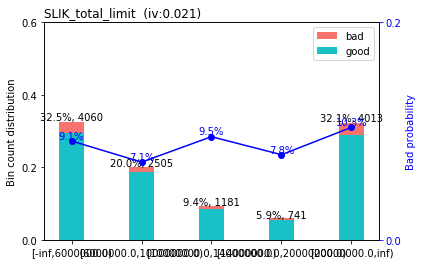

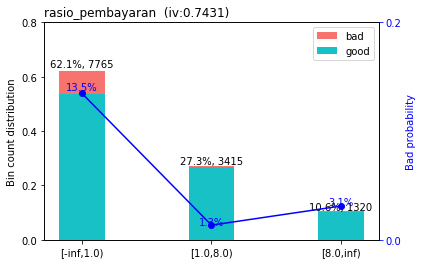

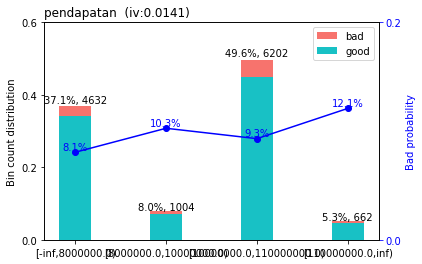

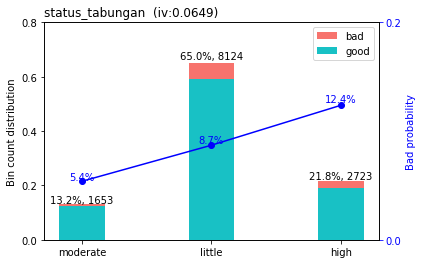

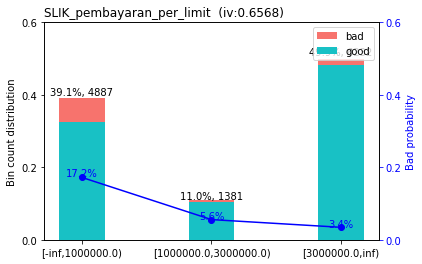

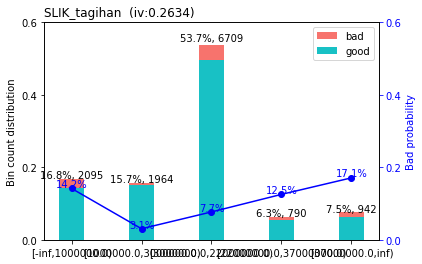

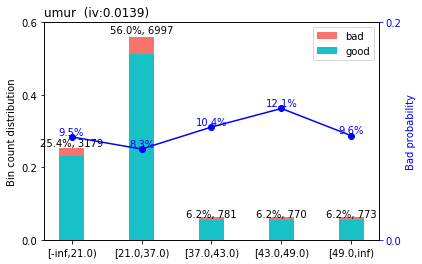

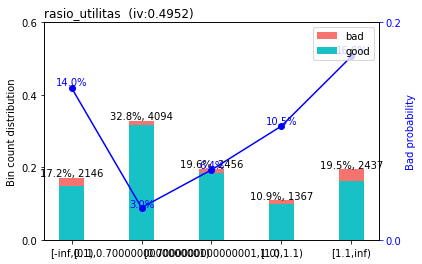

In [ ]:
#Cara membaca hasil WoE Bins

#Breaking dt into train and test
train, test = sc.split_df(dt_s, 'target_default').values()

#woe binning 
bins = sc.woebin(dt_s, y="target_default")

#melihat plot hasil dari WoE dan IV
sc.woebin_plot(bins)

#hasil dari WoE dan IV secara kalkulasi  
print(bins)

**CONTOH INTERPRETASI**

Pada grafik chart trend dari rasio pembayaran, kita dapat melihat ada nilai IV dari rasio pembayaran yaitu 0.7431. Grafik chart trend juga membagi rasio pembayaran menjadi tiga kelompok yaitu

Kelompok 0 - 1% :  dimana terdapat 7,765 nasabah  dengan rasio pembayaran antara 0 hingga 1%. Jumlah nasabah 7,765 merupakan 61% dari semua total nasabah di dataset. Kelompok rasio ini memiliki 13.5% nasabah yang akhirnya gagal bayar.
Kelompok 1 - 8% :  terdapat 3,415 nasabah yang merupakan 27.3% dari total distribusi. Dengan rasio gagal bayar berupa 1.3%
Kelompok > 8% :  hanya terdapat 1,320 nasabah (10.6%), dengan rasio gagal bayar sekitar 3.1%
Secara umum berarti trend dari rasio pembayaran menunjukan bahwa semakin tinggi rasio pembayaran, maka semakin kecil kemungkinan gagal bayar.

In [ ]:
#Converting train and test into woe values
train_woe = sc.woebin_ply(train, bins)
test_woe = sc.woebin_ply(test, bins)

y_train = train_woe.loc[:,'target_default']
x_train = train_woe.loc[:,train_woe.columns !='target_default']
y_test = test_woe.loc[:,'target_default']
x_test = test_woe.loc[:,train_woe.columns != 'target_default']

#membuat scorecard dengan menggunakan algoritma logistic regression
from sklearn.linear_model import LogisticRegression
lr= LogisticRegression(penalty="l1", C=0.9, solver='saga', n_jobs=1)
lr.fit(x_train, y_train)
#lr.coef
#lr.intercept_

#predicted probability
train_pred = lr.predict_proba(x_train)[:,1]
test_pred = lr.predict_proba(x_test)[:,1]

[INFO] converting into woe values ...
[INFO] converting into woe values ...


/usr/local/lib/python3.6/dist-packages/scorecardpy/perf.py:33: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  ], ignore_index=True)


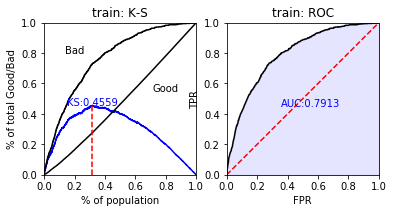

/usr/local/lib/python3.6/dist-packages/scorecardpy/perf.py:33: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  ], ignore_index=True)


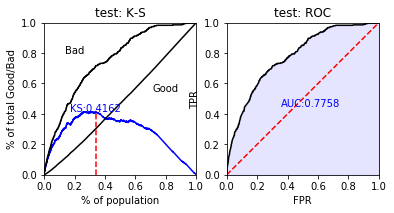

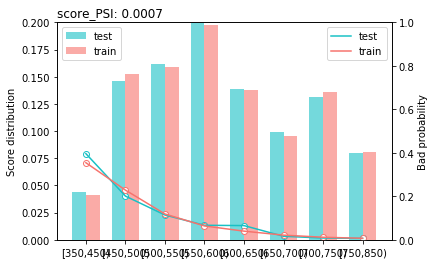

{'pic': {'score': <Figure size 432x288 with 2 Axes>},
 'psi':   variable       PSI
 0    score  0.000743}

In [ ]:
#evaluasi model dengan K-S dan ROC
train_perf = sc.perf_eva(y_train, train_pred, title="train")
test_perf = sc. perf_eva(y_test, test_pred, title="test")

#membuat scorecard berdasarkan hasil dari WoE grup bin dan model logistic
card = sc.scorecard(bins, lr, x_train.columns)

#credit score
train_score = sc.scorecard_ply(train, card, print_step = 0)
test_score = sc.scorecard_ply(test, card, print_step=0)

#population stability index (PSI)
#kalkulasi PSI untk model credit score dan membuat grafik
sc.perf_psi(
    score = {'train': train_score, 'test':test_score},
    label = {'train':y_train, 'test':y_test}
)



#INTERPRETASI GRAFIK K-S DAN ROC

K-S atau Kolmogorov-Smirnov mengukur kinerja model klasifikasi. Lebih tepatnya, K-S adalah ukuran tingkat pemisahan antara distribusi baik dan buruk. Nilai K-S adalah 100 jika model dapat membedakan yang baik dan buruk secara sempurna. Di sisi lain, jika model tidak dapat membedakan antara baik dan buruk, maka seolah-olah model memilih kasus secara acak dari populasi, K-S akan menjadi 0. Dalam sebagian besar model klasifikasi, K-S akan jatuh antara 0 dan 100. Pada umumnya, minimal KS adalah 20 sebagai batas minimum menggunakan model tersebut.

Grafik ROC mirip dengan grafik kenaikan atau angkat karena grafik tersebut menyediakan sarana perbandingan antara model klasifikasi. Idealnya, kurva akan naik cepat ke kiri atas yang berarti model memprediksi kasus dengan benar. Garis merah diagonal adalah untuk model acak. Area di bawah kurva ROC (atau disebut AUC) sering digunakan sebagai ukuran kualitas model klasifikasi. Pengklasifikasi acak memiliki area di bawah kurva 0,5, sedangkan AUC untuk pengklasifikasi sempurna sama dengan 1. Dalam praktiknya, sebagian besar model klasifikasi memiliki AUC antara 0,5 dan 1.

#INTERPRETASI GRAFIK PSI

PSI (Population Stability Index) adalah evaluasi model yang sering diterapkan untuk mengukur apakah calon nasabah yang ingin mengajukan aplikasi masih memiliki profil yang sama ketika model dibuat. PSI dari library scorecard akan membagi hasil scorecard menjadi delapan bagian besar, dan melihat apakah jumlah populasi antara data Train dan Test memiliki perbedaan populasi yang besar atau tidak. 

Tujuan dari PSI adalah untuk mengetahui apakah profile kebanyakan calon nasabah sudah berubah, sehingga diperlukan untuk membuat model baru atau tidak.

Hasil dari PSI dapat diinterpretasikan sebagai berikut:
1. Jika PSI<= 0.1 maka tidak ada perubahan (tidak perlu mengubah model)
2. Jika 0.1 - 0.25, terjadi perubahan kecil (akan tetapi tetap tidak perlu mengubah model)
3. Jika PSI> 0.25, terjadi perubahan signifikan (perlu diinvestigasi lebih lanjut apakah perubahan profile terjadi secara permanen atau tidak?)


In [ ]:
#hasil dari scorecard adalah
print(card)

{'basepoints':      variable  bin  points
0  basepoints  NaN   556.0, 'SLIK_total_limit':            variable                      bin  points
0  SLIK_total_limit         [-inf,6000000.0)    -0.0
1  SLIK_total_limit   [6000000.0,10000000.0)    11.0
2  SLIK_total_limit  [10000000.0,14000000.0)    -2.0
3  SLIK_total_limit  [14000000.0,20000000.0)     7.0
4  SLIK_total_limit         [20000000.0,inf)    -6.0, 'rasio_pembayaran':            variable         bin  points
5  rasio_pembayaran  [-inf,1.0)   -14.0
6  rasio_pembayaran   [1.0,8.0)    63.0
7  rasio_pembayaran   [8.0,inf)    36.0, 'pendapatan':       variable                       bin  points
8   pendapatan          [-inf,8000000.0)     7.0
9   pendapatan    [8000000.0,10000000.0)    -7.0
10  pendapatan  [10000000.0,110000000.0)    -1.0
11  pendapatan         [110000000.0,inf)   -17.0, 'status_tabungan':            variable       bin  points
12  status_tabungan  moderate    12.0
13  status_tabungan    little     1.0
14  status_tabung

Dari hasil print(card) kita dapat melihat bahwa model scorecard memberikan penilaian sebagai berikut:
                      range       points
1. rasio_pembayaran  [-inf,1.0)   -14.0
2. rasio_pembayaran   [1.0,8.0)    63.0
3. rasio_pembayaran   [8.0,inf)    36.0

Dari hasil model, kita dapat melihat bahwa rasio pembayaran yang kurang dari 1% diberikan nilai negatif 14 oleh model tersebut, sedangkan untuk nilai lainnya diberikan nilai positif. **Ini berarti semakin rendah rasio pembayaran, semakin kecil nilai dari credit scoring nya dan semakin kecil pula kemungkinan nasabah tersebut akan dapat membayar utangnya.**

#Topic 5: Evaluation and Deployment
 
teman-teman akan belajar cara mengevaluasi model yang telah kita buat, apakah model yang telah kita buat bagus atau tidak. Lalu, kita juga akan belajar cara menerapkan model yang telah kita buat dalam proses kerja.

In [ ]:
 #implementasi Model Coding

 #ingat di bab 3: Data preparation
 #dimana kita membedakan data menjadi data train dan test
 X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

 #di bab 4, Modeling, kita membuat model
 from sklearn.ensemble import RandomForestClassifier
 classifier = RandomForestClassifier(n_estimators = 10,
                                     criterion = 'entropy', random_state = 0)
 classifier.fit(X_train, y_train)

 #dibagian ini kita akan menggunakan model tersebut
 #untuk memprediksi data test
 predicted = classifier.predict(X_test)
 predicted_proba = classifier.predict_proba(X_test)

 #melihat hasil probabilitas prrediksi
 print(predicted_proba)

[[1.  0. ]
 [1.  0. ]
 [1.  0. ]
 ...
 [0.9 0.1]
 [1.  0. ]
 [0.9 0.1]]


In [ ]:
#1. CONFUSION MATRIX

from sklearn.metrics import confusion_matrix

#data preparation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

#modeling
from sklearn.tree import DecisionTreeClassifier
classifier = RandomForestClassifier(n_estimators= 10,
                                    criterion = 'entropy', random_state = 0)
classifier.fit(X_train, y_train)

#di bagian ini kita akan menggunakan model tersebut untuk memprediksi data test
predicted = classifier.predict(X_test)

#kita akan cek hasil confusion matrix antara hasil sebenarnya dengan prediksi dari model ke data set
matrix = confusion_matrix(y_test, predicted)

#cek hasil matrix
print(matrix)

[[3374   49]
 [ 301   26]]


#interpretasi confusion matrix

Dari hasil confusion matrix hasilnya adalah true positive 3,374 dan true negative 26, dengan false positive at 301 and false negative at 26. Dalam pembuatan confusion matrix dalam Python, Positive adalah berhasil bayar dan Negative adalah gagal bayar.

Ingatlah bahwa confusion matrix ini akan berbeda-beda setiap kali kita jalankan koding ini karena pembentukan data train dan test dilakukan secara acak.

In [ ]:
#2. Classification Report

from sklearn.metrics import classification_report

report = classification_report(y_test, predicted)
print(report)


              precision    recall  f1-score   support

           0       0.92      0.99      0.95      3423
           1       0.35      0.08      0.13       327

    accuracy                           0.91      3750
   macro avg       0.63      0.53      0.54      3750
weighted avg       0.87      0.91      0.88      3750



In [ ]:
pip install scikit-plot

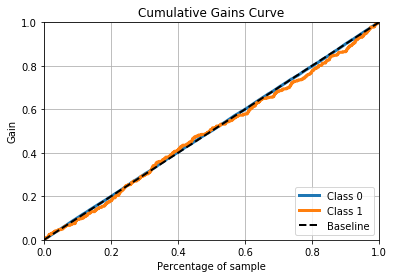

In [ ]:
#3. Gain and Lift Chart

#membuat scikitplot untuk membuat gain-life chart
#install library scikiplot terlebih dahulu

import matplotlib.pyplot as plt
import scikitplot as skplt

skplt.metrics.plot_cumulative_gain(y_train, predicted_proba)
plt.show()

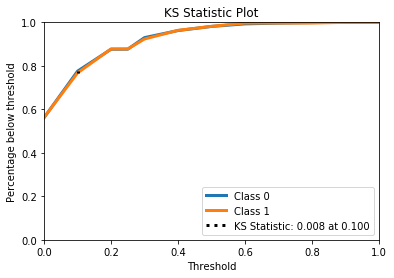

In [ ]:
#4. Komogorov-Smimov 

import matplotlib.pyplot as plt
import scikitplot as skplt

skplt.metrics.plot_ks_statistic(y_test, predicted_proba)
plt.show()

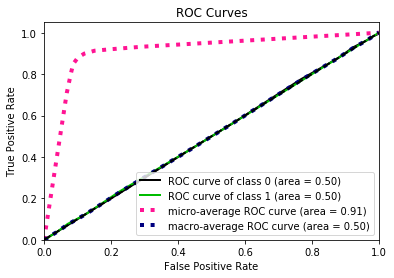

In [ ]:
#5. AUC- ROC dan GINI

import scikitplot as skplt

#membuat chart ROC dan menghitung AUC
skplt.metrics.plot_roc(y_test, predicted_proba)

plt.show()

In [ ]:
#evaluasi model juga dilihat dari segi keputusan bisnis: apakah lebih besar keuntungan vs kerugian jika menerapkan model tersebut.